In [1]:
import pandas as pd
import xgboost as xgb
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn import model_selection
import optuna
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
from pandas_profiling import ProfileReport
import os 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import plot_confusion_matrix, confusion_matrix
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
# from xfeat import SelectCategorical, LabelEncoder, Pipeline, ConcatCombination, SelectNumerical, \
#     ArithmeticCombinations, TargetEncoder, aggregation, GBDTFeatureSelector, GBDTFeatureExplorer
import seaborn as sns
import warnings
import featuretools as ft
import featuretools.variable_types as vtypes
import imblearn as imb
import collections
import pycm
import math

from sklearn.manifold import TSNE

warnings.simplefilter('ignore')


def seed_everything(seed=0):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    
seed_everything(0)

In [2]:
# train_x['emb_1'] = emb[:, 0]

In [3]:
def save_result(array, fname):
    res = pd.DataFrame([range(4046, 8092), array]).T
    res.to_csv(fname, index=False, header=False)
    print('saved!!')


In [4]:
test = pd.read_csv("../data/test.csv")
train = pd.read_csv("../data/train.csv")

# train.loc[~(train['genre'] == 6), 'genre'] = 0
# train.loc[train['genre'] == 6, 'genre'] = 1 

y = train['genre']
train.drop(columns='genre', inplace=True)
random.seed(0)
features = train.columns.values[1:]


In [5]:
def weights_df(df):
    feature_weight = {}
    for i in df.columns:
        if 'region_' in i:
            feature_weight[i] = 100

    feature_weight["popularity"] = 8.0
    feature_weight["tempo"] = 0.001
    feature_weight["tempo_range"] = 0.001
#     feature_weight["svc"] = 10
    feature_weight['count_nan'] = 100
    for col in df.columns:
        if not col in feature_weight:
            feature_weight[col] = 1

    features = feature_weight.keys()
    features_weight = [feature_weight[col] for col in features]
    df = df.astype('float64')
    return df[features] * feature_weight

In [6]:
def count_nan(df):
    df["count_nan"] = 0
    for col in [
        "acousticness",
        "positiveness",
        "danceability",
        "energy",
        "liveness",
        "speechiness",
        "instrumentalness",
    ]:
        df["count_nan"] += df[col].isna()
    return df


def tempo2mean_and_range(df):
    # tempo カラムの各要素を '-' で区切ってリストにする
    df['tempo'] = df['tempo'].apply(lambda x: x.split('-'))
    df['tempo_min'] = df['tempo'].apply(lambda x: x[0])
    df['tempo_max'] = df['tempo'].apply(lambda x: x[1])
    df['tempo_min'] = df['tempo_min'].astype(float)
    df['tempo_max'] = df['tempo_max'].astype(float)
    df['tempo_range'] = df['tempo_max'] - df['tempo_min']
    df['tempo'] = (df['tempo_max']+df['tempo_min'])/2
    df['tempo'] = df['tempo'].astype(float)
    df = df.drop(columns='tempo_max')
    df = df.drop(columns='tempo_min')

    return df

# カテゴリカルデータをすべてOne-Hot表現に変換
def region2not_onehot(df):
    df['region'] = df['region'].astype('category').cat.codes
    return df

def region2onehot(df):
    tmp = df['tempo']
    df = df.drop(columns='tempo')
    df = pd.get_dummies(df, drop_first=True)
    df['tempo'] = tmp
    return df

def add_res(df, fname, name):
    res = pd.read_csv(fname, header=None)[1]
    df[name] = res
    df[name] = df[name].astype('category')
    
    return df

def add_other_res(train_df, test_df):
#     train_df = add_res(train_df, '../data/result/xg_weighted.csv', 'xgb')
#     test_df = add_res(test_df, '../data/result/xg_weighted_train.csv', 'xgb')
    train_df = add_res(train_df, '../data/result/knn.csv', 'knn')
    test_df = add_res(test_df, '../data/result/knn_train.csv', 'knn')
#     train_df = add_res(train_df, '../data/result/rf_weighted.csv', 'rf')
#     test_df = add_res(test_df, '../data/result/rf_weighted_train.csv', 'rf')
#     train_df = add_res(train_df, '../data/result/svc_weighted_train.csv', 'svc')
#     test_df = add_res(test_df, '../data/result/svc_weighted.csv', 'svc')
    
    return train_df, test_df

def aggregation(df):
    df['region'] = df['region'].astype('category')
    es = ft.EntitySet()
    es = es.entity_from_dataframe(entity_id='df', dataframe=df, index='index')
    es = es.normalize_entity(base_entity_id='df',
                         new_entity_id='region',
                         index='region')
    feature_matrix, feature_defs = ft.dfs(entityset=es,
                                      target_entity='df',
                                      trans_primitives=[],
#                                       agg_primitives=['count', 'sum', 'mean'],
                                      max_depth=2,)
    return feature_matrix 


def comb_feature(df):
    df['region'] = df['region'].astype('category')
    es = ft.EntitySet()
    es = es.entity_from_dataframe(entity_id='df', dataframe=df, index='index')
    df, feature_defs = ft.dfs(entityset=es,
                                      target_entity='df',
                                      trans_primitives=['divide_numeric'],
                                      agg_primitives=[],
                                      max_depth=1)
    df=df.replace([np.inf, -np.inf], 1e6)
    return df 

def cliping(df):
    for i in df.columns:
        p01 = df[i].quantile(0.01)
        p99 = df[i].quantile(0.99)
        df[i] = df[i].clip(p01, p99)
    return df 

def tsne_embedded(df):
    emb = TSNE(n_components=2).fit_transform(df)
    df['emb0'] = emb[:, 0]
    df['emb1'] = emb[:, 1]
    return df
    

def preprocessing(train_df, test_df):
    df = pd.concat([train_df, test_df])
    df = region2onehot(df)
    df = tempo2mean_and_range(df)
#     df = comb_feature(df[features])
#     df2 = aggregation(df[features])
#     df = pd.merge(df, df2)

#     df['region'] = df['region'].astype('int64')
#     df = cliping(df)
    df = count_nan(df)
    df = df.fillna(-1)
#     df = tsne_embedded(df)
#     df['region'] = df['region'].astype('category')
#     df = df.drop(columns='region_region_M') # because importance is zero.
    df = df.drop(columns='index')
    df[:] = StandardScaler().fit_transform(df)
    df = weights_df(df)
    test_x = df[len(df)-len(test_df):]
    train_x = df[:len(df)-len(test_df)]

        
    return train_x, test_x

In [7]:
train_x, test_x = preprocessing(train, test)

In [8]:
knn_model = pd.read_pickle('../data/model/knn.pkl')
pred_knn = knn_model.predict(test_x)
tmp = list(map(max, knn_model.predict_proba(test_x)))
tmp = np.asarray(tmp)
# # train_x['is_pseudo'] = 0
# # test_x['is_pseudo'] = 1
new_train_x = pd.concat([train_x, test_x[tmp > 0.7]])
new_y = pd.concat([y, pd.DataFrame(pred_knn)[tmp > 0.7]])

In [9]:
# def proba_ent(x, y, model):
#     train_x['knn_proba'] = np.zeros(len(train_x))
#     vals = []
#     for tr_i, te_i in KFold().split(train_x, y):
#         model.fit(x.values[tr_i], y.values[tr_i])
# #         proba = model.predict_proba(x[i:i+1])[0]
#         pred = model.predict_proba(x.values[te_i])
#         pred = list(map(max, pred))
# #         val = ent(proba)
#         train_x['knn_proba'][te_i] = pred
# #         vals.append(pred)
        
new_train_x

,region_region_B,region_region_C,region_region_D,region_region_E,region_region_F,region_region_G,region_region_H,region_region_I,region_region_J,region_region_K,...,count_nan,duration_ms,acousticness,positiveness,danceability,loudness,energy,liveness,speechiness,instrumentalness
0,-30.118605,-14.692918,-23.072584,-44.807547,-19.451238,-11.685039,447.416828,-49.121755,-8.496657,-24.607003,...,-4.967316,-0.499932,-0.952816,-1.287888,-1.768608,1.430045,1.428017,0.602324,1.872265,4.293089
1,-30.118605,-14.692918,-23.072584,-44.807547,-19.451238,-11.685039,-22.350523,203.575790,-8.496657,-24.607003,...,-4.967316,0.812810,-1.000812,-0.486860,0.320377,0.525867,1.331250,-0.445640,-0.348785,-0.579079
2,-30.118605,-14.692918,-23.072584,223.176689,-19.451238,-11.685039,-22.350523,-49.121755,-8.496657,-24.607003,...,-4.967316,-0.547223,0.651280,-0.830314,-0.231222,-0.390048,-0.823739,-0.302016,1.667744,-0.308015
3,-30.118605,680.600010,-23.072584,-44.807547,-19.451238,-11.685039,-22.350523,-49.121755,-8.496657,-24.607003,...,-4.967316,0.722347,-0.731795,-0.914337,-0.807106,0.638890,1.302955,0.685433,0.284464,-0.251143
4,-30.118605,-14.692918,-23.072584,-44.807547,-19.451238,-11.685039,-22.350523,-49.121755,-8.496657,-24.607003,...,-4.967316,0.432123,-0.627031,1.336833,1.893289,0.924070,0.218929,-0.597384,0.243767,0.071330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4038,-30.118605,-14.692918,-23.072584,-44.807547,-19.451238,-11.685039,-22.350523,-49.121755,-8.496657,-24.607003,...,-4.967316,-0.217653,1.608004,-1.273139,-0.709622,-1.629088,-1.495011,-0.506319,-0.884801,-0.132456
4039,-30.118605,-14.692918,-23.072584,223.176689,-19.451238,-11.685039,-22.350523,-49.121755,-8.496657,-24.607003,...,-4.967316,-0.173308,1.859598,-1.692659,-1.491092,-0.140391,-0.618685,3.683988,0.623318,-0.250995
4040,-30.118605,-14.692918,-23.072584,-44.807547,-19.451238,-11.685039,-22.350523,-49.121755,-8.496657,-24.607003,...,-4.967316,0.123748,-0.563920,-0.222265,-1.021242,0.038453,0.130323,-0.566198,-0.633488,-0.257916
4041,332.020694,-14.692918,-23.072584,-44.807547,-19.451238,-11.685039,-22.350523,-49.121755,-8.496657,-24.607003,...,-4.967316,1.523884,-0.934429,-0.616067,0.023186,1.177068,1.084735,0.334727,0.089334,-0.101727


In [10]:
def weights_df(trial):
    feature_weight = {}
    features = train_x.columns
    for col in features:
        feature_weight[col] = trial.suggest_loguniform(f'{col}', 1e-3, 10)
    
    features_weight = [feature_weight[col] for col in features]
    acc = cross_val_score(svc_model, train_x*feature_weight, y).mean()
    return 1-acc

In [11]:
# train_train_x, train_test_x, train_train_y, train_test_y = model_selection.train_test_split(train_x, y.values, test_size=0.2, random_state=0)
# train_train_x, train_test_x, train_train_y, train_test_y = model_selection.train_test_split(new_train_x, new_y.values, test_size=0.2, random_state=0)


In [16]:
def xg(trial):
    params = {
        'objective': 'multi:softmax',
        'num_class': 11,
        'eval_metric': lambda i, j: 1-f1_score(i, j, average='macro'),
        'max_depth': trial.suggest_int('max_depth', 7, 20),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
        'subsample': trial.suggest_discrete_uniform('subsample', 0.5, 0.9, 0.1),
        'colsample_bytree': trial.suggest_discrete_uniform('colsample_bytree', 0.5, 0.9, 0.1),
        'n_estimators': 1000,
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-8, 1.0),
        'reg_lambda': trial.suggest_discrete_uniform('lambda', 0, 1, 0.1)
    }
    model = xgb.XGBClassifier(**params)
#     model.fit(train_train_x, train_train_y)

#     pred = model.predict(train_test_x)

#     accuracy = f1_score(train_test_y, pred, average='macro')
    accuracy = cross_val_score(model, new_train_x, new_y, scoring='f1_macro').mean()
    return (1-accuracy)

In [17]:
def knn(trial):
    params = {
        'n_neighbors': trial.suggest_int('n_neighbors', 1, 100),
        'leaf_size': trial.suggest_int('leaf_size', 1, 100),
        'weights': trial.suggest_categorical('weights', ['distance', 'uniform']),
    }
    
    model = KNeighborsClassifier(**params)
#     model.fit(train_train_x, train_train_y)
#     pred = model.predict(train_test_x)

#     accuracy = f1_score(train_test_y, pred, average='macro')
    accuracy = cross_val_score(model, train_x, y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()
    return (1-accuracy)

In [18]:
def rf(trial):
    params = {
        'n_estimators': 1000,
        'max_depth':trial.suggest_int('max_depth', 10, 100),
        'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 2, 1000),
        'min_samples_split': trial.suggest_int('min_samples_split',2, 5),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf',1,10),
    }

    model = RandomForestClassifier(**params, random_state=0)
#     model.fit(train_train_x, train_train_y)
#     pred = model.predict(train_test_x)
#     accuracy = f1_score(train_test_y, pred, average='macro')
    accuracy = cross_val_score(model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()

    return 1-accuracy

In [19]:
def svc(trial):
    params = {
        'kernel': 'rbf',
        'C': trial.suggest_loguniform('C', 1e+0, 1e+2/2),
        'gamma': trial.suggest_loguniform('gamma', 1e-3, 3.0),
#         'class_weight': trial.suggest_categorical('class_weight', ['balanced', None]),
    }
    model = SVC(**params)
    accuracy = cross_val_score(model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0, n_splits=4)).mean()
#     accuracy = cross_val_score(model, new_train_x, new_y, scoring='f1_macro').mean()
#     accuracy = cross_val_score(model, train_x, y, scoring='f1_macro').mean()
    return 1-accuracy

In [22]:
xg_study = optuna.create_study(sampler=optuna.samplers.RandomSampler(seed=0))
xg_study.optimize(xg, n_trials=50)
xg_model = xgb.XGBClassifier(**xg_study.best_params)
xg_cv = np.mean(cross_val_score(xg_model, new_train_x, new_y, cv=KFold(shuffle=True, random_state=0, n_splits=3), scoring='f1_macro'))
print(xg_cv)

xg_model.fit(new_train_x, new_y.values)
pred_y = xg_model.predict(test_x)
pred_train = xg_model.predict(train_x)

# print(f1_score(pred_train, y.values, average='macro'))
# save_result(pred_y, '../data/result/xg_label.csv')
# save_result(pred_train, '../data/result/xg_label_train.csv')
# pd.to_pickle(xg_model, '../data/model/xg_label.pkl')

[I 2021-05-09 19:45:40,219] A new study created in memory with name: no-name-c935d035-09ef-4543-8b49-48466fda72e7


[19:45:40] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:46:26] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:47:11] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:47:56] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 19:49:26,409] Trial 0 finished with value: 0.8035936326415978 and parameters: {'max_depth': 14, 'min_child_weight': 15, 'subsample': 0.8, 'colsample_bytree': 0.7, 'learning_rate': 2.4504079607415994e-05, 'lambda': 0.7000000000000001}. Best is trial 0 with value: 0.8035936326415978.


[19:49:26] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:50:05] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:50:43] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:51:22] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 19:52:42,562] Trial 1 finished with value: 0.45511324091097927 and parameters: {'max_depth': 13, 'min_child_weight': 18, 'subsample': 0.9, 'colsample_bytree': 0.6, 'learning_rate': 0.021567524728780586, 'lambda': 0.5}. Best is trial 1 with value: 0.45511324091097927.


[19:52:42] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:53:07] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:53:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:54:00] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 19:54:54,520] Trial 2 finished with value: 0.8230798930358878 and parameters: {'max_depth': 14, 'min_child_weight': 19, 'subsample': 0.5, 'colsample_bytree': 0.5, 'learning_rate': 1.4512665303724043e-08, 'lambda': 0.9}. Best is trial 1 with value: 0.45511324091097927.


[19:54:54] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:55:49] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:56:42] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:57:33] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 19:59:45,259] Trial 3 finished with value: 0.7889451703817513 and parameters: {'max_depth': 17, 'min_child_weight': 18, 'subsample': 0.9, 'colsample_bytree': 0.8, 'learning_rate': 4.9185251681822834e-05, 'lambda': 0.8}. Best is trial 1 with value: 0.45511324091097927.


[19:59:45] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:00:25] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:01:03] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:01:42] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:03:01,853] Trial 4 finished with value: 0.8029706214700114 and parameters: {'max_depth': 8, 'min_child_weight': 13, 'subsample': 0.5, 'colsample_bytree': 0.9, 'learning_rate': 0.00014955005393691516, 'lambda': 0.4}. Best is trial 1 with value: 0.45511324091097927.


[20:03:01] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:03:40] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:04:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:05:02] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:06:23,484] Trial 5 finished with value: 0.8196646328122763 and parameters: {'max_depth': 10, 'min_child_weight': 16, 'subsample': 0.7, 'colsample_bytree': 0.7, 'learning_rate': 1.4135735278417051e-08, 'lambda': 0.6000000000000001}. Best is trial 1 with value: 0.45511324091097927.


[20:06:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:07:19] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:08:16] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:09:12] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:11:07,086] Trial 6 finished with value: 0.7251325463828666 and parameters: {'max_depth': 15, 'min_child_weight': 13, 'subsample': 0.9, 'colsample_bytree': 0.8, 'learning_rate': 7.517322886250534e-06, 'lambda': 0.4}. Best is trial 1 with value: 0.45511324091097927.


[20:11:07] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:12:35] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:14:00] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:15:28] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:18:26,729] Trial 7 finished with value: 0.41982484654525065 and parameters: {'max_depth': 16, 'min_child_weight': 2, 'subsample': 0.8, 'colsample_bytree': 0.8, 'learning_rate': 4.820149280505929e-07, 'lambda': 0.1}. Best is trial 7 with value: 0.41982484654525065.


[20:18:26] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:18:39] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:18:52] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:19:06] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:19:33,705] Trial 8 finished with value: 0.4536060352636534 and parameters: {'max_depth': 11, 'min_child_weight': 8, 'subsample': 0.7, 'colsample_bytree': 0.7, 'learning_rate': 0.8072177525850062, 'lambda': 0.1}. Best is trial 7 with value: 0.41982484654525065.


[20:19:33] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:20:29] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:21:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:22:22] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:24:13,441] Trial 9 finished with value: 0.5305604581011809 and parameters: {'max_depth': 9, 'min_child_weight': 4, 'subsample': 0.8, 'colsample_bytree': 0.6, 'learning_rate': 5.3763332795841517e-05, 'lambda': 0.2}. Best is trial 7 with value: 0.41982484654525065.


[20:24:13] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:25:03] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:25:54] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:26:47] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:28:34,549] Trial 10 finished with value: 0.5793400798193986 and parameters: {'max_depth': 9, 'min_child_weight': 3, 'subsample': 0.8, 'colsample_bytree': 0.5, 'learning_rate': 3.738168671235754e-07, 'lambda': 0.4}. Best is trial 7 with value: 0.41982484654525065.


[20:28:34] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:28:48] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:29:01] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:29:14] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:29:41,176] Trial 11 finished with value: 0.4085609480978205 and parameters: {'max_depth': 18, 'min_child_weight': 2, 'subsample': 0.9, 'colsample_bytree': 0.5, 'learning_rate': 0.6481502906344189, 'lambda': 0.5}. Best is trial 11 with value: 0.4085609480978205.


[20:29:41] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:30:29] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:31:15] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:32:03] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:33:38,529] Trial 12 finished with value: 0.8145957942207223 and parameters: {'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.8, 'colsample_bytree': 0.5, 'learning_rate': 1.8300194291134087e-06, 'lambda': 0.1}. Best is trial 11 with value: 0.4085609480978205.


[20:33:38] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:34:37] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:34] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:38:30,855] Trial 13 finished with value: 0.5056099052185735 and parameters: {'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.6, 'colsample_bytree': 0.7, 'learning_rate': 3.259717550795507e-08, 'lambda': 0.7000000000000001}. Best is trial 11 with value: 0.4085609480978205.


[20:38:30] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:39:18] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:40:06] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:40:55] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:42:33,925] Trial 14 finished with value: 0.7026590725927698 and parameters: {'max_depth': 14, 'min_child_weight': 6, 'subsample': 0.7, 'colsample_bytree': 0.5, 'learning_rate': 0.0004051090678768292, 'lambda': 1.0}. Best is trial 11 with value: 0.4085609480978205.


[20:42:34] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:15] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:43:56] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:44:40] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:46:07,095] Trial 15 finished with value: 0.8169312741835174 and parameters: {'max_depth': 11, 'min_child_weight': 14, 'subsample': 0.5, 'colsample_bytree': 0.8, 'learning_rate': 2.0665634478498945e-06, 'lambda': 0.2}. Best is trial 11 with value: 0.4085609480978205.


[20:46:07] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:47:35] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:49:02] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:50:28] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:53:23,311] Trial 16 finished with value: 0.420092508090381 and parameters: {'max_depth': 15, 'min_child_weight': 1, 'subsample': 0.9, 'colsample_bytree': 0.5, 'learning_rate': 0.0026456494193148254, 'lambda': 0.2}. Best is trial 11 with value: 0.4085609480978205.


[20:53:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:53:58] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:54:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:55:05] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:56:11,848] Trial 17 finished with value: 0.8099015512531287 and parameters: {'max_depth': 17, 'min_child_weight': 20, 'subsample': 0.6, 'colsample_bytree': 0.7, 'learning_rate': 0.0005449233905603223, 'lambda': 0.6000000000000001}. Best is trial 11 with value: 0.4085609480978205.


[20:56:11] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:56:54] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:57:36] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:58:18] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 20:59:44,088] Trial 18 finished with value: 0.5888890871016546 and parameters: {'max_depth': 10, 'min_child_weight': 20, 'subsample': 0.7, 'colsample_bytree': 0.9, 'learning_rate': 0.003943067417080244, 'lambda': 0.30000000000000004}. Best is trial 11 with value: 0.4085609480978205.


[20:59:44] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:00:10] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:00:36] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:01:03] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:01:58,878] Trial 19 finished with value: 0.37237702737400935 and parameters: {'max_depth': 18, 'min_child_weight': 8, 'subsample': 0.9, 'colsample_bytree': 0.7, 'learning_rate': 0.1132095058758038, 'lambda': 0.7000000000000001}. Best is trial 19 with value: 0.37237702737400935.


[21:01:58] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:02:55] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:03:51] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:04:47] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:06:42,475] Trial 20 finished with value: 0.668217673625168 and parameters: {'max_depth': 17, 'min_child_weight': 11, 'subsample': 0.9, 'colsample_bytree': 0.8, 'learning_rate': 2.4594635381022534e-05, 'lambda': 0.6000000000000001}. Best is trial 19 with value: 0.37237702737400935.


[21:06:42] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:07:35] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:08:24] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:09:15] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:10:46,900] Trial 21 finished with value: 0.6144737687166688 and parameters: {'max_depth': 7, 'min_child_weight': 7, 'subsample': 0.8, 'colsample_bytree': 0.6, 'learning_rate': 0.0008792723816659194, 'lambda': 0.4}. Best is trial 19 with value: 0.37237702737400935.


[21:10:46] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:11:33] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:12:26] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:13:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:15:01,367] Trial 22 finished with value: 0.6174974234372707 and parameters: {'max_depth': 8, 'min_child_weight': 6, 'subsample': 0.7, 'colsample_bytree': 0.7, 'learning_rate': 0.0003931895716831657, 'lambda': 0.7000000000000001}. Best is trial 19 with value: 0.37237702737400935.


[21:15:01] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:15:51] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:16:43] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:17:34] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:19:18,626] Trial 23 finished with value: 0.7083601101087896 and parameters: {'max_depth': 16, 'min_child_weight': 9, 'subsample': 0.9, 'colsample_bytree': 0.6, 'learning_rate': 3.0684524815021146e-05, 'lambda': 0.9}. Best is trial 19 with value: 0.37237702737400935.


[21:19:18] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:19:56] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:20:33] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:21:12] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:22:29,849] Trial 24 finished with value: 0.5851587725916211 and parameters: {'max_depth': 18, 'min_child_weight': 15, 'subsample': 0.5, 'colsample_bytree': 0.9, 'learning_rate': 0.005175238826679791, 'lambda': 1.0}. Best is trial 19 with value: 0.37237702737400935.


[21:22:29] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:23:03] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:23:34] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:24:06] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:25:10,901] Trial 25 finished with value: 0.8209157963034218 and parameters: {'max_depth': 9, 'min_child_weight': 18, 'subsample': 0.5, 'colsample_bytree': 0.8, 'learning_rate': 9.78497820827326e-08, 'lambda': 0.9}. Best is trial 19 with value: 0.37237702737400935.


[21:25:10] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:25:49] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:26:27] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:27:07] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:28:24,328] Trial 26 finished with value: 0.5788614541091583 and parameters: {'max_depth': 18, 'min_child_weight': 12, 'subsample': 0.7, 'colsample_bytree': 0.5, 'learning_rate': 0.0037969089700001014, 'lambda': 0.4}. Best is trial 19 with value: 0.37237702737400935.


[21:28:24] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:29:17] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:30:09] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:31:01] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:32:49,250] Trial 27 finished with value: 0.8200356067709276 and parameters: {'max_depth': 17, 'min_child_weight': 18, 'subsample': 0.9, 'colsample_bytree': 0.9, 'learning_rate': 1.2408311098510618e-08, 'lambda': 0.30000000000000004}. Best is trial 19 with value: 0.37237702737400935.


[21:32:49] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:45] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:40] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:37] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:37:32,242] Trial 28 finished with value: 0.6704874884613595 and parameters: {'max_depth': 17, 'min_child_weight': 4, 'subsample': 0.7, 'colsample_bytree': 0.5, 'learning_rate': 3.9808168702672347e-07, 'lambda': 0.0}. Best is trial 19 with value: 0.37237702737400935.


[21:37:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:38:53] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:40:16] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:41:39] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:44:21,888] Trial 29 finished with value: 0.38444883040535993 and parameters: {'max_depth': 18, 'min_child_weight': 5, 'subsample': 0.6, 'colsample_bytree': 0.9, 'learning_rate': 0.00431832391488306, 'lambda': 0.0}. Best is trial 19 with value: 0.37237702737400935.


[21:44:21] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:44:37] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:44:54] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:45:10] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:45:46,369] Trial 30 finished with value: 0.48575451224586497 and parameters: {'max_depth': 9, 'min_child_weight': 13, 'subsample': 0.7, 'colsample_bytree': 0.6, 'learning_rate': 0.29765417836096464, 'lambda': 0.6000000000000001}. Best is trial 19 with value: 0.37237702737400935.


[21:45:46] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:46:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:47:20] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:48:06] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:49:41,770] Trial 31 finished with value: 0.8031740888188399 and parameters: {'max_depth': 14, 'min_child_weight': 12, 'subsample': 0.8, 'colsample_bytree': 0.6, 'learning_rate': 1.533799167560123e-05, 'lambda': 0.2}. Best is trial 19 with value: 0.37237702737400935.


[21:49:41] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:50:21] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:51:01] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:51:43] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:53:05,318] Trial 32 finished with value: 0.8155279577241494 and parameters: {'max_depth': 9, 'min_child_weight': 19, 'subsample': 0.8, 'colsample_bytree': 0.7, 'learning_rate': 6.596552508781356e-07, 'lambda': 0.2}. Best is trial 19 with value: 0.37237702737400935.


[21:53:05] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:53:52] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:54:37] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:55:24] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 21:56:53,140] Trial 33 finished with value: 0.7753756599117971 and parameters: {'max_depth': 7, 'min_child_weight': 9, 'subsample': 0.6, 'colsample_bytree': 0.8, 'learning_rate': 1.051997515967866e-05, 'lambda': 0.1}. Best is trial 19 with value: 0.37237702737400935.


[21:56:53] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:57:40] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:58:27] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:59:13] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:00:51,011] Trial 34 finished with value: 0.46834245319958057 and parameters: {'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8, 'colsample_bytree': 0.7, 'learning_rate': 0.00019617049541740744, 'lambda': 0.9}. Best is trial 19 with value: 0.37237702737400935.


[22:00:51] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:01:49] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:02:44] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:03:42] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:05:39,863] Trial 35 finished with value: 0.6210137793169404 and parameters: {'max_depth': 20, 'min_child_weight': 5, 'subsample': 0.8, 'colsample_bytree': 0.6, 'learning_rate': 1.4628776195564048e-08, 'lambda': 0.8}. Best is trial 19 with value: 0.37237702737400935.


[22:05:39] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:06:35] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:07:30] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:08:26] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:10:20,022] Trial 36 finished with value: 0.5562065781641048 and parameters: {'max_depth': 11, 'min_child_weight': 8, 'subsample': 0.7, 'colsample_bytree': 0.9, 'learning_rate': 0.0010761052463669095, 'lambda': 0.9}. Best is trial 19 with value: 0.37237702737400935.


[22:10:20] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:10:57] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:11:35] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:12:12] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:13:27,978] Trial 37 finished with value: 0.6757174430762096 and parameters: {'max_depth': 10, 'min_child_weight': 16, 'subsample': 0.5, 'colsample_bytree': 0.9, 'learning_rate': 0.003161594818168373, 'lambda': 0.2}. Best is trial 19 with value: 0.37237702737400935.


[22:13:28] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:10] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:51] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:15:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:16:55,130] Trial 38 finished with value: 0.8148546927322119 and parameters: {'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.6, 'colsample_bytree': 0.6, 'learning_rate': 0.00013983172377391104, 'lambda': 0.0}. Best is trial 19 with value: 0.37237702737400935.


[22:16:55] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:17:34] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:15] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:54] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:20:16,255] Trial 39 finished with value: 0.7792119298464002 and parameters: {'max_depth': 9, 'min_child_weight': 9, 'subsample': 0.6, 'colsample_bytree': 0.7, 'learning_rate': 1.6635262195405436e-06, 'lambda': 0.6000000000000001}. Best is trial 19 with value: 0.37237702737400935.


[22:20:16] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:21:11] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:22:08] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:23:04] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:24:57,223] Trial 40 finished with value: 0.3928754798420745 and parameters: {'max_depth': 19, 'min_child_weight': 3, 'subsample': 0.7, 'colsample_bytree': 0.5, 'learning_rate': 0.005430970571865733, 'lambda': 0.4}. Best is trial 19 with value: 0.37237702737400935.


[22:24:57] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:25:42] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:26:27] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:27:12] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:28:46,940] Trial 41 finished with value: 0.6565360871842261 and parameters: {'max_depth': 14, 'min_child_weight': 4, 'subsample': 0.5, 'colsample_bytree': 0.7, 'learning_rate': 6.996839355377205e-06, 'lambda': 1.0}. Best is trial 19 with value: 0.37237702737400935.


[22:28:46] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:29:27] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:30:09] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:30:49] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:32:13,555] Trial 42 finished with value: 0.8085398872809271 and parameters: {'max_depth': 17, 'min_child_weight': 15, 'subsample': 0.9, 'colsample_bytree': 0.5, 'learning_rate': 0.0002615409876262629, 'lambda': 0.6000000000000001}. Best is trial 19 with value: 0.37237702737400935.


[22:32:13] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:32:52] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:33:31] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:34:10] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:35:27,865] Trial 43 finished with value: 0.7683206650741374 and parameters: {'max_depth': 20, 'min_child_weight': 6, 'subsample': 0.6, 'colsample_bytree': 0.5, 'learning_rate': 1.3534338579304768e-08, 'lambda': 1.0}. Best is trial 19 with value: 0.37237702737400935.


[22:35:27] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:36:04] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:36:39] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:37:15] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:38:28,237] Trial 44 finished with value: 0.8130693182596415 and parameters: {'max_depth': 16, 'min_child_weight': 16, 'subsample': 0.6, 'colsample_bytree': 0.7, 'learning_rate': 3.248195265267119e-08, 'lambda': 0.5}. Best is trial 19 with value: 0.37237702737400935.


[22:38:28] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:39:06] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:39:44] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:40:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:41:39,977] Trial 45 finished with value: 0.813886306182416 and parameters: {'max_depth': 20, 'min_child_weight': 18, 'subsample': 0.6, 'colsample_bytree': 0.9, 'learning_rate': 7.13859941029657e-07, 'lambda': 1.0}. Best is trial 19 with value: 0.37237702737400935.


[22:41:40] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:42:29] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:43:17] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:44:06] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:45:43,413] Trial 46 finished with value: 0.776322369646752 and parameters: {'max_depth': 20, 'min_child_weight': 16, 'subsample': 0.8, 'colsample_bytree': 0.9, 'learning_rate': 2.2088299179531348e-06, 'lambda': 0.9}. Best is trial 19 with value: 0.37237702737400935.


[22:45:43] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:45:55] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:46:08] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:46:21] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:47:12,661] Trial 47 finished with value: 0.42929270180826884 and parameters: {'max_depth': 15, 'min_child_weight': 1, 'subsample': 0.6, 'colsample_bytree': 0.5, 'learning_rate': 0.7155419802639282, 'lambda': 0.5}. Best is trial 19 with value: 0.37237702737400935.


[22:47:12] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:47:39] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:48:07] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:48:32] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:49:23,836] Trial 48 finished with value: 0.46522750487523956 and parameters: {'max_depth': 13, 'min_child_weight': 13, 'subsample': 0.6, 'colsample_bytree': 0.5, 'learning_rate': 0.03775216526799782, 'lambda': 0.2}. Best is trial 19 with value: 0.37237702737400935.


[22:49:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:49:39] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:49:55] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:50:11] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[I 2021-05-09 22:50:44,011] Trial 49 finished with value: 0.46694034175272847 and parameters: {'max_depth': 14, 'min_child_weight': 5, 'subsample': 0.5, 'colsample_bytree': 0.9, 'learning_rate': 0.607233764788223, 'lambda': 1.0}. Best is trial 19 with value: 0.37237702737400935.


[22:50:44] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:50:48] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:50:52] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.6218193362867238
[22:50:57] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd lik

In [23]:
knn_study = optuna.create_study(sampler=optuna.samplers.RandomSampler(seed=0))
knn_study.optimize(knn, n_trials=30)
knn_model = KNeighborsClassifier(**knn_study.best_params)
knn_cv = cross_val_score(knn_model, new_train_x, new_y.values, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()
print(knn_cv)
knn_model.fit(new_train_x, new_y.values)
knn_pred_y = knn_model.predict(test_x)
knn_pred_train = knn_model.predict(train_x)
# save_result(knn_pred_y, '../data/result/knn_final.csv')
# save_result(knn_pred_train, '../data/result/knn_final_train.csv')
# pd.to_pickle(knn_model, '../data/model/knn_final.pkl')

[I 2021-05-09 22:51:04,740] A new study created in memory with name: no-name-31904a05-2dd7-4bbf-884a-189627c19e00
[I 2021-05-09 22:51:05,410] Trial 0 finished with value: 0.5379917568890062 and parameters: {'n_neighbors': 55, 'leaf_size': 72, 'weights': 'distance'}. Best is trial 0 with value: 0.5379917568890062.
[I 2021-05-09 22:51:06,200] Trial 1 finished with value: 0.6373517987087269 and parameters: {'n_neighbors': 43, 'leaf_size': 65, 'weights': 'uniform'}. Best is trial 0 with value: 0.5379917568890062.
[I 2021-05-09 22:51:06,934] Trial 2 finished with value: 0.5801714978525535 and parameters: {'n_neighbors': 97, 'leaf_size': 39, 'weights': 'distance'}. Best is trial 0 with value: 0.5379917568890062.
[I 2021-05-09 22:51:07,759] Trial 3 finished with value: 0.6724118400485164 and parameters: {'n_neighbors': 57, 'leaf_size': 93, 'weights': 'uniform'}. Best is trial 0 with value: 0.5379917568890062.
[I 2021-05-09 22:51:08,479] Trial 4 finished with value: 0.4094312291888673 and para

0.725133665863636


In [16]:
# knn_model.fit(new_train_x, new_y)
# knn_pred = knn_model.predict(test_x)

(array([  29.,  160.,  137.,  350.,   46.,   88.,   39.,  306., 1462.,
        1429.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <BarContainer object of 10 artists>)

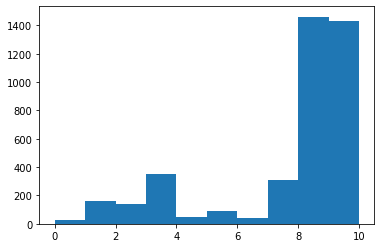

In [18]:
# svc_model.fit(new_train_x, new_y)
# svc_pred = svc_model.predict(test_x)

In [24]:
# rf_study = optuna.create_study(sampler=optuna.samplers.RandomSampler(seed=0))
rf_study = optuna.create_study()
rf_study.optimize(rf, n_trials=50)
rf_model = RandomForestClassifier(**rf_study.best_params)
# rf_cv = np.mean(cross_val_score(rf_model, new_train_x, new_y, cv=KFold(shuffle=True, random_state=0), scoring='f1_macro'))
rf_cv = np.mean(cross_val_score(rf_model, new_train_x, new_y, scoring='f1_macro'))
print(rf_cv)
rf_model.fit(new_train_x, new_y.values)
pred_y = rf_model.predict(test_x)
pred_train = rf_model.predict(train_x)
# save_result(pred_y, '../data/result/rf_label07.csv')
# save_result(pred_train, '../data/result/rf_label07_train.csv')
# pd.to_pickle(rf_model, '../data/model/rf_label07.pkl')

[I 2021-05-09 22:51:28,206] A new study created in memory with name: no-name-3ad1a767-1966-45e0-b955-86de35f5febe
[I 2021-05-09 22:52:19,624] Trial 0 finished with value: 0.43865472711182574 and parameters: {'max_depth': 93, 'max_leaf_nodes': 792, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 0 with value: 0.43865472711182574.
[I 2021-05-09 22:53:00,588] Trial 1 finished with value: 0.49731575169428577 and parameters: {'max_depth': 32, 'max_leaf_nodes': 134, 'min_samples_split': 2, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.43865472711182574.
[I 2021-05-09 22:53:43,167] Trial 2 finished with value: 0.45742765013122866 and parameters: {'max_depth': 73, 'max_leaf_nodes': 404, 'min_samples_split': 2, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.43865472711182574.
[I 2021-05-09 22:54:23,608] Trial 3 finished with value: 0.4454614312958549 and parameters: {'max_depth': 15, 'max_leaf_nodes': 298, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is tria

0.6149997646954718


In [21]:
svc_study = optuna.create_study(sampler=optuna.samplers.RandomSampler(seed=0))
svc_study.optimize(svc, n_trials=50)
svc_model = SVC(**svc_study.best_params, random_state=0)
svc_cv = np.mean(cross_val_score(svc_model, new_train_x, new_y, cv=KFold(shuffle=True, random_state=0), scoring='f1_macro'))
print(svc_cv)
# svc_model.fit(new_train_x, new_y.values)
# pred_y = svc_model.predict(test_x)
# pred_train = svc_model.predict(train_x)
# save_result(pred_y, '../data/result/svc_label07.csv')
# save_result(pred_train, '../data/result/svc_label07_train.csv')
# pd.to_pickle(svc_model, '../data/model/svc_label07.pkl')

[I 2021-05-09 19:34:10,238] A new study created in memory with name: no-name-530826ee-7ab7-4ac9-b450-7ab2c9b02903
[I 2021-05-09 19:34:30,459] Trial 0 finished with value: 0.3616540485129701 and parameters: {'C': 8.558894657793088, 'gamma': 0.30676100149812735}. Best is trial 0 with value: 0.3616540485129701.
[I 2021-05-09 19:34:40,335] Trial 1 finished with value: 0.263455551301355 and parameters: {'C': 10.570046446158269, 'gamma': 0.07845577141205881}. Best is trial 1 with value: 0.263455551301355.
[I 2021-05-09 19:34:58,175] Trial 2 finished with value: 0.2841008682033166 and parameters: {'C': 5.245378070737081, 'gamma': 0.17613763016070647}. Best is trial 1 with value: 0.263455551301355.
[I 2021-05-09 19:35:20,319] Trial 3 finished with value: 0.8508060330986101 and parameters: {'C': 5.539206377511996, 'gamma': 1.2612548678037208}. Best is trial 1 with value: 0.263455551301355.
[I 2021-05-09 19:35:27,600] Trial 4 finished with value: 0.27262354763765406 and parameters: {'C': 43.3744

0.7428790864385343


In [17]:
cross_val_score(svc_model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0, n_splits=5)).mean()

0.7428790864385343

In [35]:
# xg_model = pd.read_pickle('../data/model/xg_label.pkl')
# rf_model = pd.read_pickle('../data/model/rf_label07.pkl')
# cross_val_score(xg_model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()
# voting = VotingClassifier([('svc', svc_model), ('knn', knn_model), ('xg', xg_model), ('rf', rf_model)], weights=[2, 1, 1, 1])
# voting.fit(new_train_x, new_y)
# cross_val_score(voting, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()
# voting_pred = voting.predict(test_x)
# save_result(voting_pred, '../data/model/final_voting.csv')
# plt.hist(voting_pred)

[01:51:19] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:51:27] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:51:35] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:51:42] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

0.7460029905991274

In [18]:
svc_models = []
for i in range(10):
    svc_model = SVC(**svc_study.best_params, random_state=i)
    svc_models.append((f'{i}', svc_model))
    
svc_voting = VotingClassifier(svc_models)
cross_val_score(svc_voting, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()

0.7428790864385343

In [69]:
cross_val_score(svc_model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()

0.7428790864385343

<AxesSubplot:>

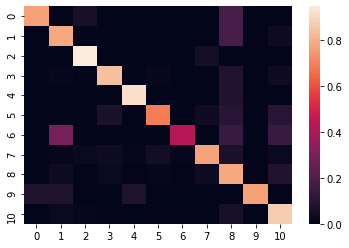

In [56]:
knn_model.fit(train_train_x, train_train_y)
pred = knn_model.predict(train_test_x)
sns.heatmap(confusion_matrix(pred, train_test_y, normalize='true'))

<AxesSubplot:>

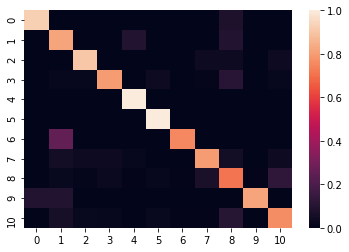

In [58]:
rf_model.fit(train_train_x, train_train_y)
pred = rf_model.predict(train_test_x)
sns.heatmap(confusion_matrix(pred, train_test_y, normalize='true'))

[15:16:43] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<AxesSubplot:>

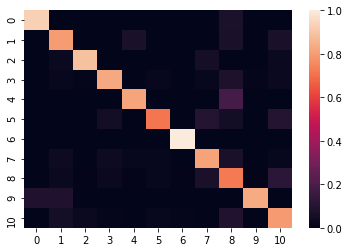

In [59]:
xg_model.fit(train_train_x, train_train_y)
pred = xg_model.predict(train_test_x)
sns.heatmap(confusion_matrix(pred, train_test_y, normalize='true'))

<AxesSubplot:>

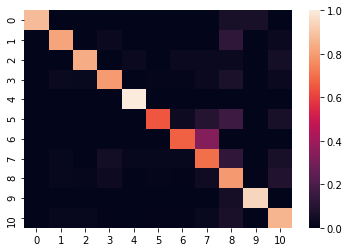

In [109]:
svc_model.fit(train_train_x, train_train_y)
pred = svc_model.predict(train_test_x)
sns.heatmap(confusion_matrix(pred, train_test_y, normalize='true'))

In [65]:
# def create_models(model):
#     vals = []
#     for i in range(100):
#         re_x, re_y = under_sampling(new_train_x, new_y, seed=i)
# #         tr_x, te_x, tr_y, te_y = model_selection.train_test_split(re_x, re_y, test_size=0.2, random_state=i)
# #         model.fit(re_x, re_y)
#         vals.append((f'{i}', model))
#     return vals
# knns_models = create_models(knn_model)
# svcs_models = create_models(svc_model)
voting = VotingClassifier([('svc', svc_model), ('knn', knn_model), ('rf', rf_model), ('xg', xg_model)], weights=[svc_cv, knn_cv, rf_cv, xg_])
voting_cv = cross_val_score(voting, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()
print(voting_cv)
# knns_models = VotingClassifier(knns_models)
# knns_cv = cross_val_score(knns_models, train_x, y, scoring='f1_macro').mean()
# print(knns_cv)
# knns_models.fit(train_x, y)
# svcs_models = VotingClassifier(svcs_models)
# svcs_cv = cross_val_score(svcs_models, train_x, y, scoring='f1_macro').mean()
# print(svcs_cv)
# svcs_models.fit(new_train_x, new_y)
# pred_y = svcs_models.predict(test_x)
# pred_train = svc_model.predict(train_x)
# save_result(pred_y, '../data/result/svc_label09.csv')
# save_result(pred_train, '../data/result/svc_label09_train.csv')
# pd.to_pickle(svc_model, '../data/model/svc_label09.pkl')


[17:01:54] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:02:03] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:02:13] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:02:26] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

[17:04:45] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:04:47] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:04:48] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:04:49] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

(array([  68.,  432.,  230.,  466.,   90.,  299.,  161.,  489.,  744.,
        1067.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <BarContainer object of 10 artists>)

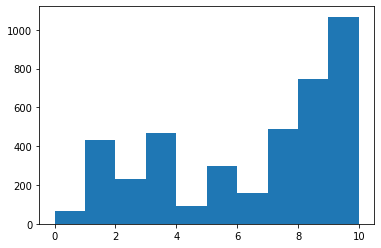

In [68]:
# bbc = imb.ensemble.BalancedBaggingClassifier(xg_model, sampling_strategy='auto', random_state=0)
# bbc_cv = cross_val_score(bbc, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0))
# bbc.fit(new_train_x, new_y)
# print(bbc_cv)
svc

In [52]:
cross_val_score(svc_model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()

0.7428790864385343

In [50]:
brf = imb.ensemble.BalancedRandomForestClassifier(n_estimators=100, random_state=0)
cross_val_score(brf, new_train_x, new_y).mean()

0.5179221858113127

In [53]:
# voting = VotingClassifier([('scv', svc_model), ('knn', knn_model), ('bbc', bbc)])
# voting.fit(new_train_x, new_y)
# pred = voting.predict(test_x)
# cross_val_score(voting, train_x, y).mean()
cross_val_score(svc_model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0))

array([0.74109486, 0.74036686, 0.74398407, 0.73593584, 0.75301381])

In [73]:

# pred_train = voting.predict(train_x)
# save_result(pred, '../data/result/voting3.csv')
# save_result(pred_train, '../data/result/voting3_train.csv')
# pd.to_pickle(voting, '../data/model/voting3.pkl')

saved!!
saved!!


In [59]:
# svc_model.fit(new_train_x, new_y)
f1_score(svc_model.predict(new_train_x), new_y, average='macro')

0.8802449648133198

In [24]:
xg_model.fit(train_x, y.values)
pred_y = xg_model.predict(test_x)

[19:29:26] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [61]:
cross_val_score(voting, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0))

VotingClassifier(estimators=[('svc',
                              SVC(C=4.081249443461285,
                                  gamma=0.03308362546133902, random_state=9)),
                             ('knn',
                              KNeighborsClassifier(leaf_size=84,
                                                   n_neighbors=3)),
                             ('xg',
                              XGBClassifier(base_score=0.5, booster='gbtree',
                                            colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=0.7, gamma=0,
                                            gpu_id=-1, importance_type='gain',
                                            interaction_constraints='',
                                            lambda=0.7...
                                            min_child_weight=8, missing=nan,
                                            monotone_co

In [89]:
# knn_model.fit(train_x, y)
pred_y = knn_model.predict(test_x)


In [51]:
pd.read_pickle('../data/model/knn_xgb_not_onehot.pkl')

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='', lambda=0.8,
              learning_rate=0.012009850477772957, max_delta_step=0,
              max_depth=12, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=0.800000012, scale_pos_weight=None,
              subsample=0.7, tree_method='exact', validate_parameters=1,
              verbosity=None)

array([[<AxesSubplot:xlabel='region_region_B', ylabel='region_region_B'>,
        <AxesSubplot:xlabel='region_region_C', ylabel='region_region_B'>,
        <AxesSubplot:xlabel='region_region_D', ylabel='region_region_B'>,
        ...,
        <AxesSubplot:xlabel='speechiness', ylabel='region_region_B'>,
        <AxesSubplot:xlabel='instrumentalness', ylabel='region_region_B'>,
        <AxesSubplot:xlabel='count_nan', ylabel='region_region_B'>],
       [<AxesSubplot:xlabel='region_region_B', ylabel='region_region_C'>,
        <AxesSubplot:xlabel='region_region_C', ylabel='region_region_C'>,
        <AxesSubplot:xlabel='region_region_D', ylabel='region_region_C'>,
        ...,
        <AxesSubplot:xlabel='speechiness', ylabel='region_region_C'>,
        <AxesSubplot:xlabel='instrumentalness', ylabel='region_region_C'>,
        <AxesSubplot:xlabel='count_nan', ylabel='region_region_C'>],
       [<AxesSubplot:xlabel='region_region_B', ylabel='region_region_D'>,
        <AxesSubplot:xlabel=

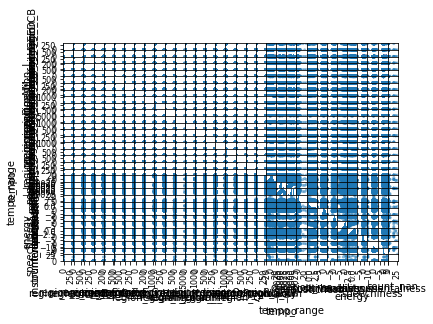

In [131]:
pd.plotting.scatter_matrix(train_x)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

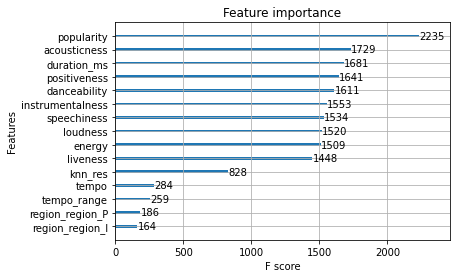

In [26]:
xgb.plot_importance(xg_model, max_num_features=15)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

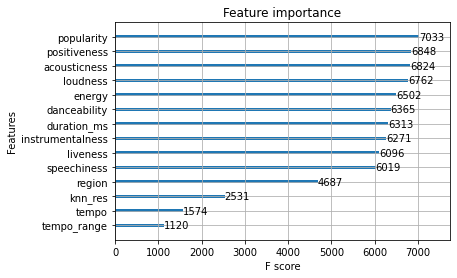

In [31]:
xgb.plot_importance(tmp)

In [44]:
pred_y

array([ 7, 10, 10, ...,  1,  8,  8])

In [45]:
def save_result(array, fname):
    res = pd.DataFrame([range(4046, 8092), array]).T
    res.to_csv(fname, index=False, header=False)


In [46]:
save_result(pred_y, '../data/result/lgbm_tuner.csv')

In [47]:
pd.to_pickle(lgbm_model, '../data/modellgbm_tuner.pkl')

In [352]:
# train_x['genre'] = y.values
train_x['genre'] = y.values
ProfileReport(train_x)

Summarize dataset:   0%|          | 0/47 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [114]:
# knn_file = pd.read_pickle("../data/model/knn_final.pkl")
# knn_cv = cvs(knn_file)
# svc_file = pd.read_pickle('../data/model/svc_label07_knn.pkl')
svc_flie = svc_model
svc_cv = cvs(svc_model)
# xg_file = pd.read_pickle('../data/model/xg_label.pkl')
# xg_cv = cvs(xg_file)
# rf_file = pd.read_pickle('../data/model/rf_label07.pkl')
# rf_cv = cvs(rf_file)

In [38]:
# def rsa(model):
#     models = []
#     for i in range(5):
#         models.append((f'{i}', RandomForestClassifier(**rf_study.best_params, random_state=i)))
#     return models
        
        
# xgs = VotingClassifier(rsa(xg_model))
# svcs = VotingClassifier(rsa(svc_model))
# rfs = VotingClassifier(rsa(rf_model))

# xgs_cv = cvs(xgs)
# svcs_cv = cvs(svcs)
# rfs_cv =  cvs(rfs)

# final_of_final = VotingClassifier([('knn', knn_model), ('xgs', xgs), ('svcs', svcs), ('rfs', rfs)], weights=[0.7, 0.6, 0.71, 0.6])
# print(cvs(final_of_final))
final_of_final.fit(new_train_x, new_y)
pred = final_of_final.predict(test_x)
save_result(pred, '../data/result/fof.csv')



[23:54:07] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:54:13] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:54:23] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:54:31] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

In [141]:
final_of_final.fit(new_train_x, new_y)
save_result(final_of_final.predict(test_x), '../data/result/final_of_final_voting.csv')

[19:23:54] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:24:02] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:24:10] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:24:20] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the ol

In [121]:
# knn_pred = knn_model.predict(test_x)
# svc_pred = svc_model.predict(test_x)
# rf_pred = rf_model.predict(test_x)
# xg_pred = xg_model.predict(test_x)
[knn_cv, svc_cv, xg_cv, rf_cv]


[0.725133665863636, 0.7428790864385343, 0.638266364896983, 0.6123325959945859]

In [33]:
def cvs(model):
    return cross_val_score(model, new_train_x, new_y, scoring='f1_macro', cv=KFold(shuffle=True, random_state=0)).mean()

In [146]:
ensmble = []
for name, items in res.iterrows():
    d = {}
#     print(items)
    for i, val in enumerate(items):
        d[val] = d.get(val, 0) + w[i]
#     print(d)
    ensmble.append(max(d, key=d.get))
    
#     break

In [145]:
w = np.array([3, rf_cv, xg_cv, 0.68, 0.66])
# save_result(ensmble, '../data/result/svc3_xg_rf_knn_lgbm.csv')

In [152]:
(ensmble == pd.read_csv('../data/result/svc_label07_knn_train.csv', header=None)[1]).value_counts()

False    2980
True     1066
Name: 1, dtype: int64

In [143]:
pd.read_csv('../data/result/svc2_xg_rf_knn_lgbm.csv')

,4046,10
0,4047,10
1,4048,10
2,4049,8
3,4050,8
4,4051,7
...,...,...
4040,8087,10
4041,8088,8
4042,8089,1
4043,8090,8


In [97]:
svc_file.predict(new_train_x)

array([10,  8,  1, ...,  8, 10,  8])

In [109]:
cvs(svc_model)

0.7428790864385343

1